# YOLOE → Any6D Pipeline

This notebook connects YOLOE (open-vocabulary detection) with Any6D (6D pose estimation).

## Pipeline
```
Anchor image (color.png)
        ↓
   YOLOE text prompt        (master_env venv)
   detects object → mask
        ↓
   Any6D register_any6d()   (Docker container)
   rgb + depth + mask + K → 4×4 pose
        ↓
   Visualization
   3D bbox + axes projected on image
```

## What we use
- **Images**: 7 anchor images from `dexycb_reference_view_ours/` (have real depth)
- **YOLOE model**: `yoloe-26l-seg.pt` with text prompt
- **Any6D mesh**: `center_mesh_<obj>.obj` from anchor folder
- **Ground truth**: `<obj>_gt_pose.txt` for error evaluation

## Prerequisites
- `source ~/open-vocabulary-6d-pose-yoloe/master_env/bin/activate`
- Copy `pipeline_utils.py` to `~/open-vocabulary-6d-pose-yoloe/notebooks/`
- Docker running with the `any6d` container

---
## Cell 1 — Paths, Imports & Setup

In [1]:
import os
import sys
import numpy as np
import cv2
import trimesh
import matplotlib.pyplot as plt

# Add notebooks folder to path so we can import pipeline_utils
NOTEBOOKS_DIR = os.path.expanduser('~/open-vocabulary-6d-pose-yoloe/notebooks')
if NOTEBOOKS_DIR not in sys.path:
    sys.path.insert(0, NOTEBOOKS_DIR)

from pipeline_utils import (
    run_yoloe_text_prompt,
    run_any6d_docker,
    plot_detection,
    plot_pose_result,
    plot_all_results_summary,
    compute_errors,
    mask_overlay,
    draw_3d_bbox,
    draw_pose_axes,
    get_mesh_bbox_corners,
    project_points,
    ANY6D_DIR,
    BASE_DIR
)

# ── Paths ─────────────────────────────────────────────────────
ANCHOR_DIR = os.path.join(ANY6D_DIR, 'anchor_results', 'dexycb_reference_view_ours')
VIZ_DIR    = os.path.join(BASE_DIR, 'notebooks', 'outputs')
os.makedirs(VIZ_DIR, exist_ok=True)

# 7 objects with their text prompts for YOLOE
OBJECTS = [
    {'folder': '006_mustard_bottle',  'prompt': 'mustard bottle',   'mesh': 'center_mesh_006_mustard_bottle.obj'},
    {'folder': '021_bleach_cleanser', 'prompt': ['white bottle', 'detergent bottle', 'cleaning bottle', 'white plastic bottle', 'laundry bottle'],  'mesh': 'center_mesh_021_bleach_cleanser.obj'},
    {'folder': '019_pitcher_base',    'prompt':['blue pitcher', 'blue jug', 'blue container', 'blue cup', 'plastic pitcher'],          'mesh': 'center_mesh_019_pitcher_base.obj'},
    {'folder': '004_sugar_box',       'prompt': 'sugar box',        'mesh': 'center_mesh_004_sugar_box.obj'},
    {'folder': '005_tomato_soup_can', 'prompt': 'tomato soup can',  'mesh': 'center_mesh_005_tomato_soup_can.obj'},
    {'folder': '003_cracker_box',     'prompt': 'cracker box',      'mesh': 'center_mesh_003_cracker_box.obj'},
    {'folder': '010_potted_meat_can', 'prompt':['yellow box', 'small box', 'square can', 'yellow can', 'small container', 'tan box'],  'mesh': 'center_mesh_010_potted_meat_can.obj'},
]

print(f'ANCHOR_DIR : {ANCHOR_DIR}')
print(f'VIZ_DIR    : {VIZ_DIR}')
print(f'Objects    : {len(OBJECTS)}')

ANCHOR_DIR : /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/anchor_results/dexycb_reference_view_ours
VIZ_DIR    : /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs
Objects    : 7


---
## Cell 2 — Check Prerequisites

In [2]:
import subprocess

all_ok = True
print('=== CHECKING PREREQUISITES ===')

# ── 1. YOLOE model ────────────────────────────────────────────
print('\n[1] YOLOE model:')
yoloe_path = os.path.join(NOTEBOOKS_DIR, 'yoloe-26l-seg.pt')
if os.path.exists(yoloe_path):
    size_mb = os.path.getsize(yoloe_path) / 1e6
    print(f'  ✅ yoloe-26l-seg.pt ({size_mb:.0f} MB)')
else:
    print(f'  ❌ Not found: {yoloe_path}')
    all_ok = False

# ── 2. Anchor images + depth + mesh ───────────────────────────
print('\n[2] Anchor data (color + depth + mask + mesh + K):')
for obj in OBJECTS:
    folder    = obj['folder']
    obj_path  = os.path.join(ANCHOR_DIR, folder)
    required  = ['color.png', 'depth.png', 'mask.png', 'K.txt', obj['mesh']]
    missing   = [f for f in required if not os.path.exists(os.path.join(obj_path, f))]
    if missing:
        print(f'  ❌ {folder} — missing: {missing}')
        all_ok = False
    else:
        print(f'  ✅ {folder}')

# ── 3. Docker ─────────────────────────────────────────────────
print('\n[3] Docker + Any6D:')
check_script = """
import sys
sys.path.insert(0, '/workspace/foundationpose/mycpp/build')
import nvdiffrast.torch as dr
from estimater import Any6D
import torch
print('GPU:', torch.cuda.get_device_name(0))
print('DOCKER_OK')
"""
script_path = os.path.join(ANY6D_DIR, '_check.py')
with open(script_path, 'w') as f:
    f.write(check_script)
r = subprocess.run(
    ['docker', 'compose', 'run', '--rm', '--entrypoint', '', 'any6d',
     'bash', '-c', 'cd /workspace && python _check.py'],
    cwd=ANY6D_DIR, capture_output=True, text=True, timeout=60
)
os.remove(script_path)
if 'DOCKER_OK' in r.stdout:
    for line in r.stdout.split('\n'):
        if any(k in line for k in ['GPU:', 'DOCKER_OK']):
            print(f'  ✅ {line.strip()}')
else:
    print('  ❌ Docker failed')
    all_ok = False

# ── 4. pipeline_utils.py ──────────────────────────────────────
print('\n[4] pipeline_utils.py:')
utils_path = os.path.join(NOTEBOOKS_DIR, 'pipeline_utils.py')
if os.path.exists(utils_path):
    print(f'  ✅ {utils_path}')
else:
    print(f'  ❌ Not found — copy pipeline_utils.py to {NOTEBOOKS_DIR}')
    all_ok = False

print(f'\n{"="*45}')
if all_ok:
    print('✅ All prerequisites OK — ready to run pipeline')
else:
    print('❌ Fix missing items above before running Cell 3')

=== CHECKING PREREQUISITES ===

[1] YOLOE model:
  ✅ yoloe-26l-seg.pt (79 MB)

[2] Anchor data (color + depth + mask + mesh + K):
  ✅ 006_mustard_bottle
  ✅ 021_bleach_cleanser
  ✅ 019_pitcher_base
  ✅ 004_sugar_box
  ✅ 005_tomato_soup_can
  ✅ 003_cracker_box
  ✅ 010_potted_meat_can

[3] Docker + Any6D:


  ✅ GPU: NVIDIA L4
  ✅ DOCKER_OK

[4] pipeline_utils.py:
  ✅ /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/pipeline_utils.py

✅ All prerequisites OK — ready to run pipeline


---
## Cell 3 — Visualize Input Data

Show color, depth, and GT mask for all 7 objects before running the pipeline.

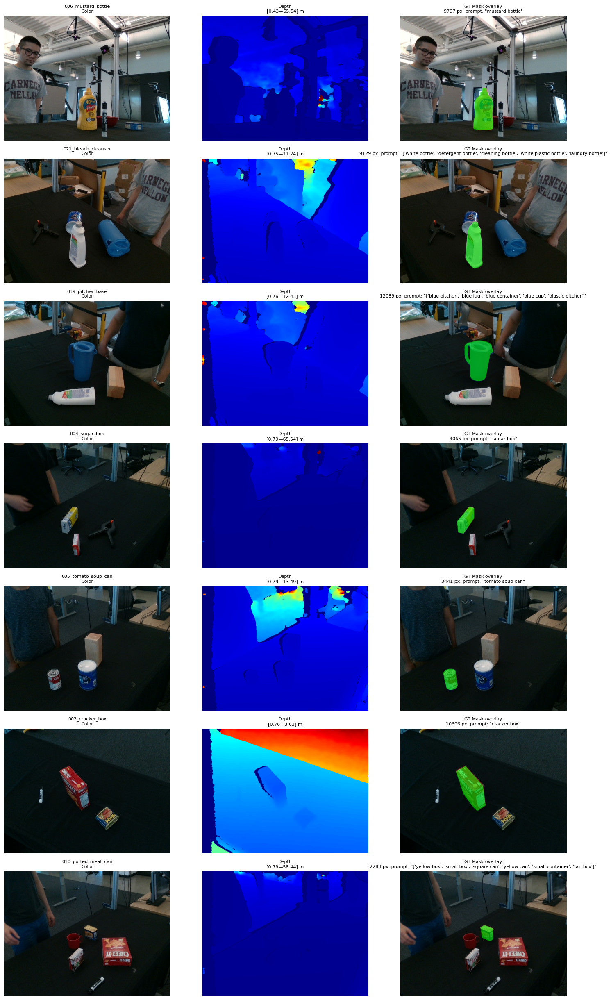

Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/pipeline_input_data.png


In [6]:
if not os.path.exists(ANCHOR_DIR):
    print('❌ Anchor folder not found')
else:
    fig, axes = plt.subplots(len(OBJECTS), 3, figsize=(15, len(OBJECTS) * 3.5))

    for i, obj in enumerate(OBJECTS):
        obj_path = os.path.join(ANCHOR_DIR, obj['folder'])

        # Load color
        color = cv2.cvtColor(cv2.imread(os.path.join(obj_path, 'color.png')), cv2.COLOR_BGR2RGB)
        axes[i, 0].imshow(color)
        axes[i, 0].set_title(f'{obj["folder"]}\nColor', fontsize=8)
        axes[i, 0].axis('off')

        # Load depth
        depth     = cv2.imread(os.path.join(obj_path, 'depth.png'), cv2.IMREAD_ANYDEPTH).astype(np.float32) / 1000.0
        depth_vis = cv2.normalize(depth, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        depth_col = cv2.cvtColor(cv2.applyColorMap(depth_vis, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        axes[i, 1].imshow(depth_col)
        axes[i, 1].set_title(f'Depth\n[{depth[depth>0].min():.2f}—{depth.max():.2f}] m', fontsize=8)
        axes[i, 1].axis('off')

        # Load mask + overlay
        mask      = cv2.imread(os.path.join(obj_path, 'mask.png'), cv2.IMREAD_GRAYSCALE)
        mask_bool = mask > 127
        overlay   = mask_overlay(color, mask_bool)
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title(f'GT Mask overlay\n{mask_bool.sum()} px  prompt: "{obj["prompt"]}"', fontsize=8)
        axes[i, 2].axis('off')

    # plt.suptitle('Input Data — All 7 Objects', fontsize=14)
    plt.tight_layout()
    out = os.path.join(VIZ_DIR, 'pipeline_input_data.png')
    plt.savefig(out, dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Saved: {out}')

---
## Cell 4 — Run YOLOE on All 7 Objects

Detect each object using its text prompt and produce a segmentation mask.


[YOLOE] 006_mustard_bottle — "mustard bottle"
[YOLOE text] ['mustard bottle'] → 1 detection(s)
  Best: conf=0.127  bbox=[281 277 357 441]  mask=10163 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/006_mustard_bottle_yoloe_detection.png


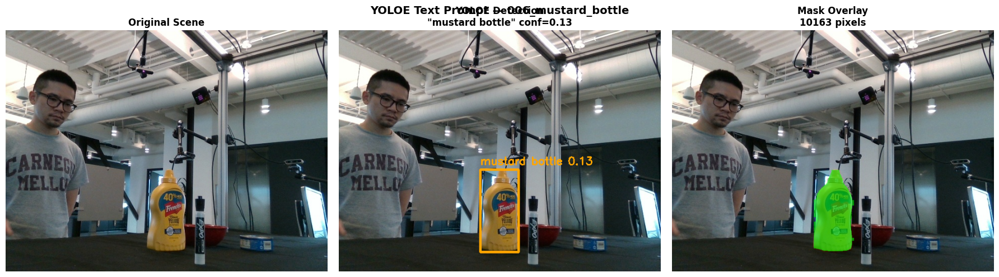


[YOLOE] 021_bleach_cleanser — "['white bottle', 'detergent bottle', 'cleaning bottle', 'white plastic bottle', 'laundry bottle']"
[YOLOE text] ['white bottle', 'detergent bottle', 'cleaning bottle', 'white plastic bottle', 'laundry bottle'] → 2 detection(s)
  Best: conf=0.894  bbox=[249 241 314 421]  mask=9790 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/021_bleach_cleanser_yoloe_detection.png


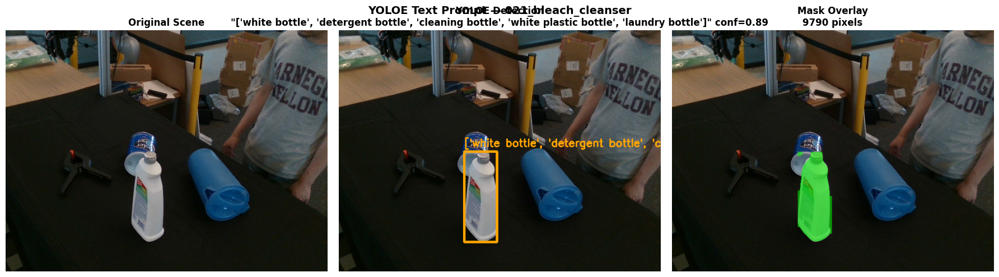


[YOLOE] 019_pitcher_base — "['blue pitcher', 'blue jug', 'blue container', 'blue cup', 'plastic pitcher']"
[YOLOE text] ['blue pitcher', 'blue jug', 'blue container', 'blue cup', 'plastic pitcher'] → 1 detection(s)
  Best: conf=0.199  bbox=[246 154 357 310]  mask=12560 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/019_pitcher_base_yoloe_detection.png


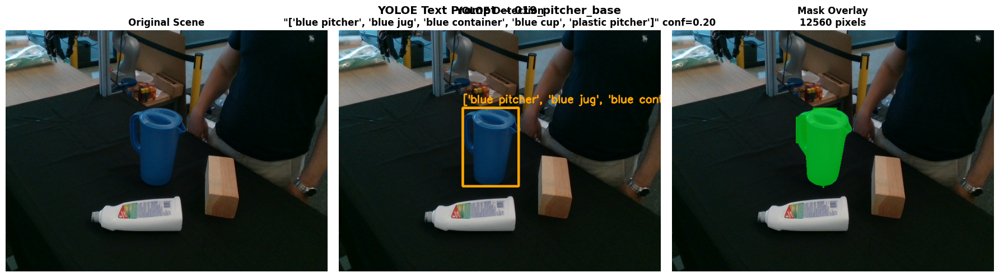


[YOLOE] 004_sugar_box — "sugar box"
[YOLOE text] ['sugar box'] → 1 detection(s)
  Best: conf=0.138  bbox=[218 244 284 348]  mask=4391 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/004_sugar_box_yoloe_detection.png


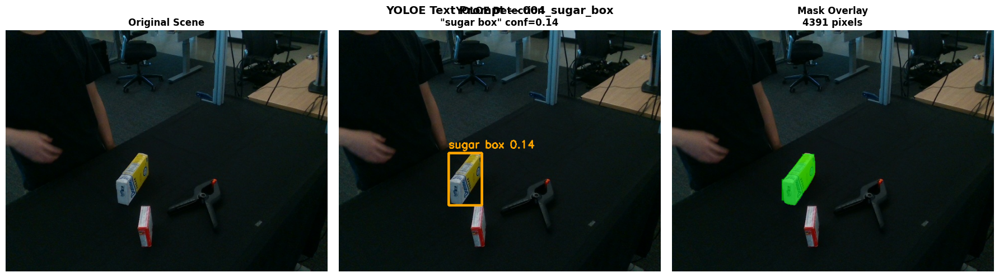


[YOLOE] 005_tomato_soup_can — "tomato soup can"
[YOLOE text] ['tomato soup can'] → 2 detection(s)
  Best: conf=0.307  bbox=[164 319 221 401]  mask=3766 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/005_tomato_soup_can_yoloe_detection.png


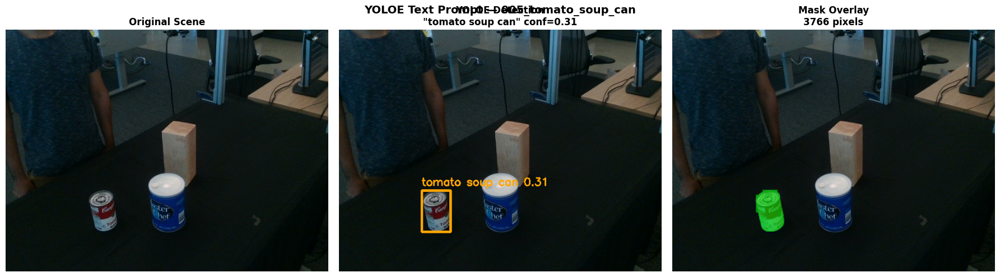


[YOLOE] 003_cracker_box — "cracker box"
[YOLOE text] ['cracker box'] → 2 detection(s)
  Best: conf=0.729  bbox=[214 144 328 313]  mask=10633 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/003_cracker_box_yoloe_detection.png


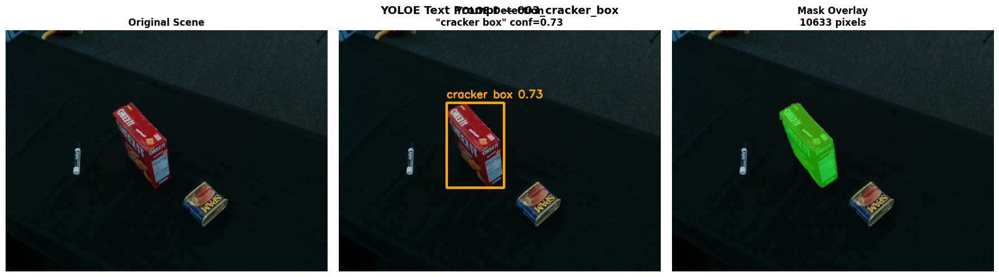


[YOLOE] 010_potted_meat_can — "['yellow box', 'small box', 'square can', 'yellow can', 'small container', 'tan box']"
[YOLOE text] ['yellow box', 'small box', 'square can', 'yellow can', 'small container', 'tan box'] → 3 detection(s)
  Best: conf=0.478  bbox=[307 208 358 266]  mask=2689 px
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/010_potted_meat_can_yoloe_detection.png


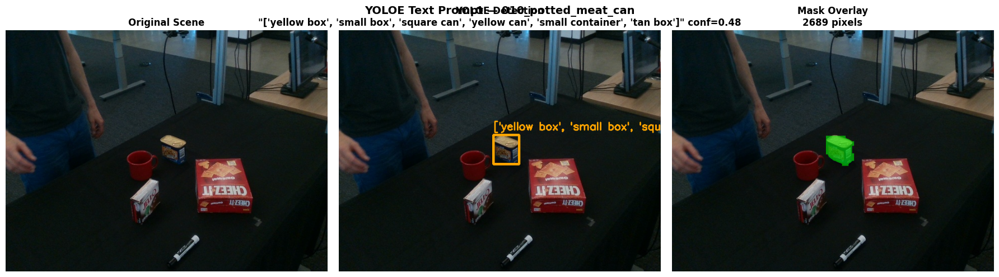


=== YOLOE DETECTION SUMMARY ===
  ✅ 006_mustard_bottle             conf=0.127  mask=10163 px
  ✅ 021_bleach_cleanser            conf=0.894  mask=9790 px
  ✅ 019_pitcher_base               conf=0.199  mask=12560 px
  ✅ 004_sugar_box                  conf=0.138  mask=4391 px
  ✅ 005_tomato_soup_can            conf=0.307  mask=3766 px
  ✅ 003_cracker_box                conf=0.729  mask=10633 px
  ✅ 010_potted_meat_can            conf=0.478  mask=2689 px


In [7]:
if not all_ok:
    print('❌ Prerequisites not met — fix Cell 2 first')
else:
    yoloe_results = {}  # store results per object

    for obj in OBJECTS:
        folder   = obj['folder']
        prompt   = obj['prompt']
        obj_path = os.path.join(ANCHOR_DIR, folder)
        scene_path = os.path.join(obj_path, 'color.png')

        print(f'\n[YOLOE] {folder} — "{prompt}"')
        try:
            bbox_xyxy, mask_bool, confidence, scene_rgb = run_yoloe_text_prompt(
                scene_path=scene_path,
                text_prompt=prompt,
                conf=0.1,   # lower threshold for harder objects
                iou=0.45
            )
            yoloe_results[folder] = {
                'bbox':       bbox_xyxy,
                'mask':       mask_bool,
                'conf':       confidence,
                'scene_rgb':  scene_rgb,
                'success':    True
            }
            # Visualize detection
            plot_detection(
                scene_rgb=scene_rgb,
                mask_bool=mask_bool,
                bbox_xyxy=bbox_xyxy,
                confidence=confidence,
                text_prompt=prompt,
                obj_name=folder,
                viz_dir=VIZ_DIR,
                save=True
            )
        except Exception as e:
            print(f'  ❌ Detection failed: {e}')
            yoloe_results[folder] = {'success': False, 'error': str(e)}

    # Summary
    print('\n=== YOLOE DETECTION SUMMARY ===')
    for folder, res in yoloe_results.items():
        if res['success']:
            print(f'  ✅ {folder:<30} conf={res["conf"]:.3f}  mask={res["mask"].sum()} px')
        else:
            print(f'  ❌ {folder:<30} {res["error"]}')

---
## Cell 5 — Run Any6D on All 7 Objects

For each object where YOLOE succeeded, run Any6D pose estimation in Docker.

**Expected time: ~5-7 minutes for all 7 objects**

In [9]:
!sudo chmod -R 777 ~/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/

In [ ]:
# !sudo chmod -R 777 ~/open-vocabulary-6d-pose-yoloe/Any6D/results/
# # ou si pas sudo:
# !mkdir -p ~/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline
# !chmod -R 777 ~/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline

chmod: changing permissions of '/home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/003_cracker_box/refine_init_mesh_003_cracker_box.obj': Operation not permitted
chmod: changing permissions of '/home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/003_cracker_box/pred_pose.txt': Operation not permitted
chmod: changing permissions of '/home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/003_cracker_box/final_mesh_003_cracker_box.obj': Operation not permitted
chmod: changing permissions of '/home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/003_cracker_box/refine': Operation not permitted
chmod: changing permissions of '/home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/003_cracker_box/refine/vis_refiner_stage_2_consider_pose_003_cracker_box.png': Operation not permitted
chmod: changing permissions of '/home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/p

In [11]:
if not all_ok:
    print('❌ Prerequisites not met — fix Cell 2 first')
elif not yoloe_results:
    print('❌ No YOLOE results — run Cell 4 first')
else:
    any6d_results = {}  # store pose results per object

    for obj in OBJECTS:
        folder = obj['folder']

        if not yoloe_results.get(folder, {}).get('success', False):
            print(f'\n[Any6D] ⚠️  Skipping {folder} — YOLOE failed')
            continue

        obj_path   = os.path.join(ANCHOR_DIR, folder)
        color_path = os.path.join(obj_path, 'color.png')
        depth_path = os.path.join(obj_path, 'depth.png')
        mesh_path  = os.path.join(obj_path, obj['mesh'])
        K          = np.loadtxt(os.path.join(obj_path, 'K.txt'))
        mask_bool  = yoloe_results[folder]['mask']
        save_path  = os.path.join(ANY6D_DIR, 'results', 'pipeline', folder)

        print(f'\n[Any6D] {folder}')
        print(f'  mask pixels : {mask_bool.sum()}')
        print(f'  mesh        : {obj["mesh"]}')

        try:
            pred_pose = run_any6d_docker(
                color_path=color_path,
                depth_path=depth_path,
                mask_bool=mask_bool,
                K=K,
                mesh_path=mesh_path,
                save_path=save_path,
                name=folder,
                iteration=5
            )

            # Load GT pose if available
            gt_pose_path = os.path.join(obj_path, f'{folder}_gt_pose.txt')
            gt_pose = np.loadtxt(gt_pose_path) if os.path.exists(gt_pose_path) else None

            # Compute errors
            if gt_pose is not None:
                err_t, err_R = compute_errors(pred_pose, gt_pose)
            else:
                err_t, err_R = 0.0, 0.0

            any6d_results[folder] = {
                'pred_pose': pred_pose,
                'gt_pose':   gt_pose,
                'err_t':     err_t,
                'err_R':     err_R,
                'K':         K,
                'success':   True
            }
            print(f'  T error: {err_t:.2f} cm   R error: {err_R:.2f}°')

        except Exception as e:
            print(f'  ❌ Any6D failed: {e}')
            any6d_results[folder] = {'success': False, 'error': str(e)}

    # Summary
    print('\n=== ANY6D RESULTS SUMMARY ===')
    for folder, res in any6d_results.items():
        if res['success']:
            print(f'  ✅ {folder:<30} T={res["err_t"]:.1f}cm  R={res["err_R"]:.1f}°')
        else:
            print(f'  ❌ {folder:<30} {res["error"]}')


[Any6D] 006_mustard_bottle
  mask pixels : 10163
  mesh        : center_mesh_006_mustard_bottle.obj


  [__init__()] self.h5_file:None
  [__init__()] self.h5_file:
  [seed_everything()] Seed set to 0
    _C._set_default_tensor_type(t)
  Warp 1.0.2 initialized:
     CUDA Toolkit 11.5, Driver 13.0
     Devices:
       "cpu"      : "x86_64"
       "cuda:0"   : "NVIDIA L4" (22 GiB, sm_89, mempool enabled)
     Kernel cache:
       /root/.cache/warp/1.0.2
  color: (480, 640, 3)
  depth: (480, 640) range [0.000, 65.535] m
  mask : 10163 pixels
  Module foundationpose.Utils load on device 'cuda:0' took 559.53 ms
  
  scale [1.03551426 1.06119506 1.3793685 ]
  POSE_SAVED
  translation (m): [0.0014585460303351283, 0.14658525586128235, 0.7479823231697083]
  num original candidates = 252
  num of pose after clustering: 252

  ✅ Pose saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/Any6D/results/pipeline/006_mustard_bottle/pred_pose.txt
  T error: 1.52 cm   R error: 133.74°

[Any6D] 021_bleach_cleanser
  mask pixels : 9790
  mesh        : center_mesh_021_bleach_cleanser.obj
  [__init__(

---
## Cell 6 — Visualize Pose Results per Object

For each object: show predicted pose (blue bbox + axes) vs ground truth (green bbox).


[VIZ] 006_mustard_bottle
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/006_mustard_bottle_pose_result.png


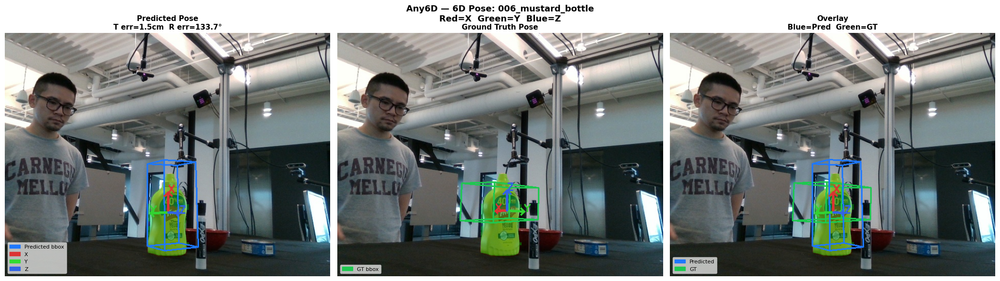


[VIZ] 021_bleach_cleanser
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/021_bleach_cleanser_pose_result.png


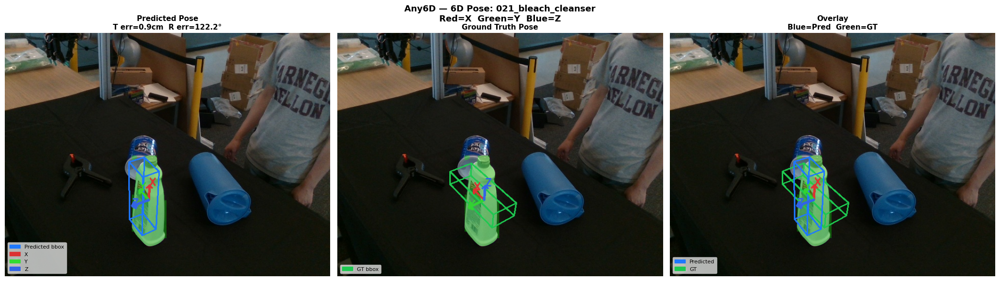


[VIZ] 019_pitcher_base
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/019_pitcher_base_pose_result.png


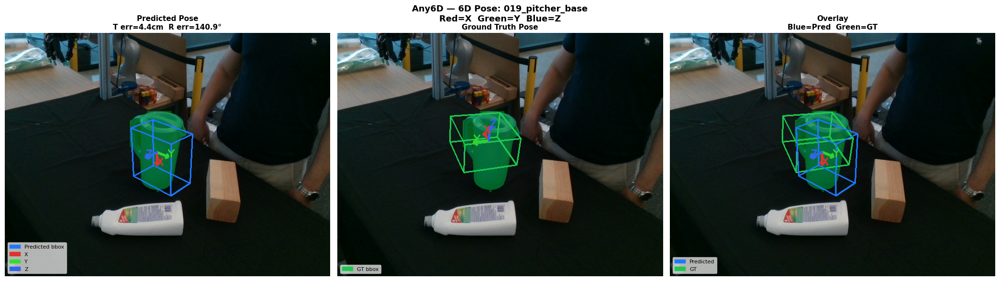


[VIZ] 004_sugar_box
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/004_sugar_box_pose_result.png


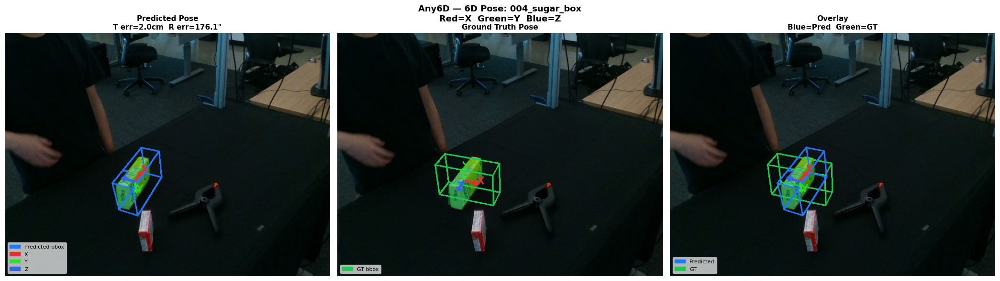


[VIZ] 005_tomato_soup_can
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/005_tomato_soup_can_pose_result.png


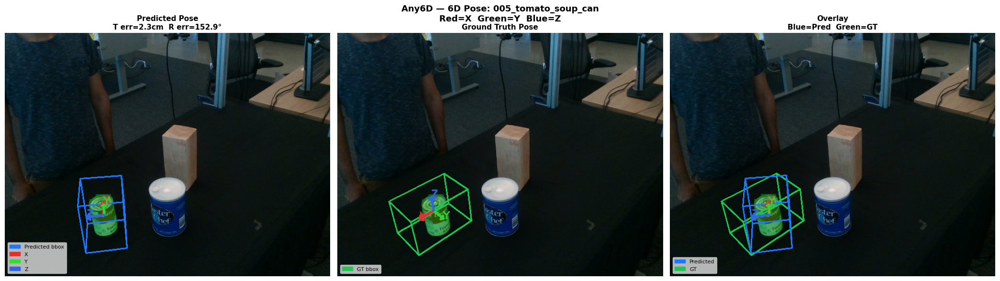


[VIZ] 003_cracker_box
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/003_cracker_box_pose_result.png


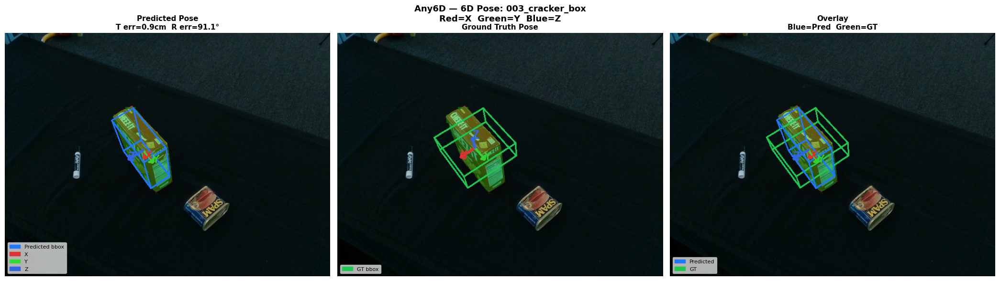


[VIZ] 010_potted_meat_can
  Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/010_potted_meat_can_pose_result.png


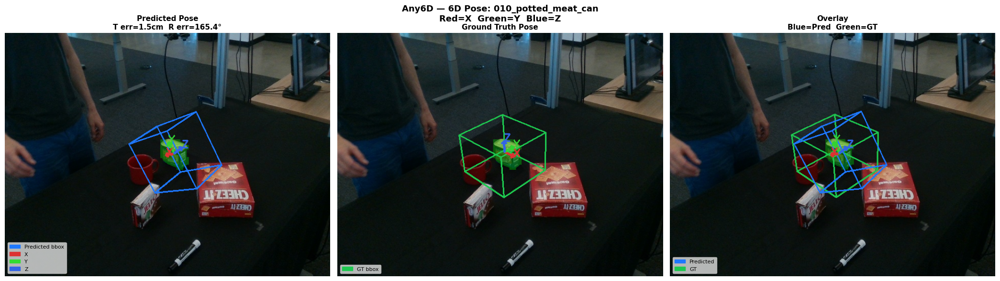

In [12]:
if not any6d_results:
    print('❌ No Any6D results — run Cell 5 first')
else:
    for obj in OBJECTS:
        folder = obj['folder']

        if not any6d_results.get(folder, {}).get('success', False):
            print(f'⚠️  Skipping {folder}')
            continue

        res        = any6d_results[folder]
        yolo_res   = yoloe_results[folder]
        obj_path   = os.path.join(ANCHOR_DIR, folder)
        mesh_path  = os.path.join(obj_path, obj['mesh'])
        mesh       = trimesh.load(mesh_path)

        print(f'\n[VIZ] {folder}')
        plot_pose_result(
            scene_rgb  = yolo_res['scene_rgb'],
            pred_pose  = res['pred_pose'],
            gt_pose    = res['gt_pose'],
            K          = res['K'],
            mesh       = mesh,
            mask_bool  = yolo_res['mask'],
            confidence = yolo_res['conf'],
            err_t      = res['err_t'],
            err_R      = res['err_R'],
            obj_name   = folder,
            viz_dir    = VIZ_DIR,
            save       = True
        )

---
## Cell 7 — Summary Plot: All 7 Objects

Bar charts of translation and rotation errors + pose thumbnails for all objects.

Saved: /home/josue_aims_ac_za/open-vocabulary-6d-pose-yoloe/notebooks/outputs/pipeline_all_results_summary.png


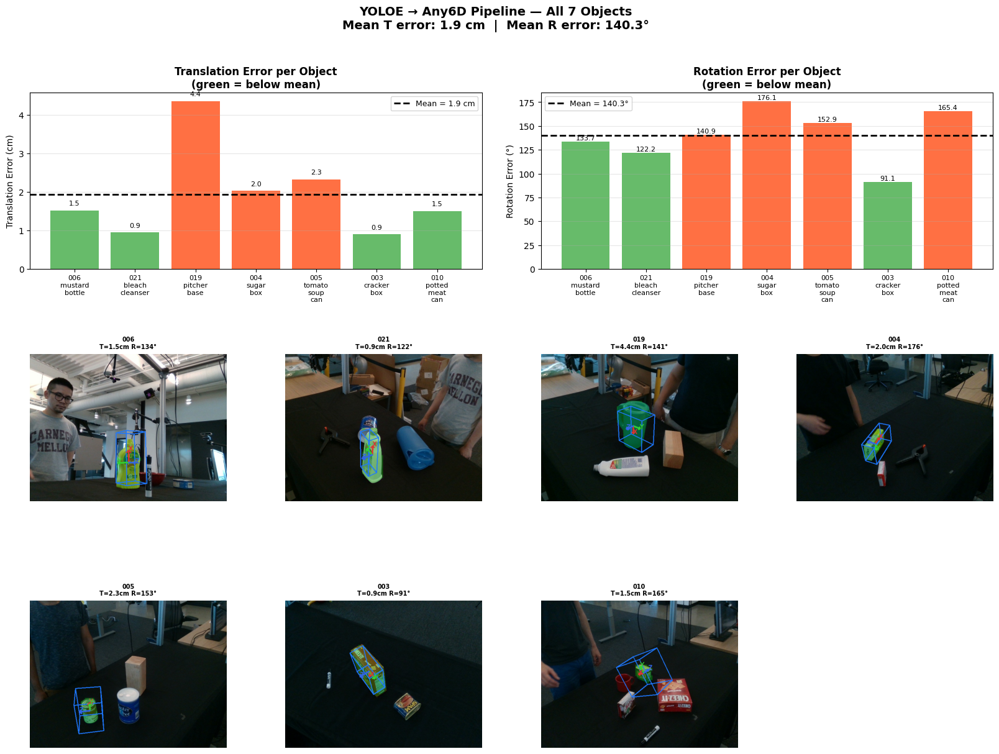

In [13]:
if not any6d_results:
    print('❌ No results — run Cell 5 first')
else:
    all_results = []

    for obj in OBJECTS:
        folder = obj['folder']
        if not any6d_results.get(folder, {}).get('success', False):
            continue

        res      = any6d_results[folder]
        yolo_res = yoloe_results[folder]
        obj_path = os.path.join(ANCHOR_DIR, folder)
        mesh     = trimesh.load(os.path.join(obj_path, obj['mesh']))

        # Build pose thumbnail
        from pipeline_utils import (
            get_mesh_bbox_corners, project_points,
            draw_3d_bbox, draw_pose_axes, mask_overlay
        )
        corners_3d = get_mesh_bbox_corners(mesh)
        base       = mask_overlay(yolo_res['scene_rgb'], yolo_res['mask'], alpha=0.25)
        c_pred     = project_points(corners_3d, res['pred_pose'], res['K'])
        img_pose   = draw_3d_bbox(base, c_pred, color=(30,120,255), thickness=2)
        img_pose   = draw_pose_axes(img_pose, res['pred_pose'], res['K'], length=0.05)

        all_results.append({
            'obj_name': folder,
            'err_t':    res['err_t'],
            'err_R':    res['err_R'],
            't_pred':   res['pred_pose'][:3, 3],
            't_gt':     res['gt_pose'][:3, 3] if res['gt_pose'] is not None else None,
            'img_pose': img_pose
        })

    plot_all_results_summary(all_results, VIZ_DIR, save=True)

---
## Cell 8 — Final Summary

In [14]:
print('=' * 55)
print('YOLOE → ANY6D PIPELINE — FINAL SUMMARY')
print('=' * 55)

if not any6d_results:
    print('\n❌ No results yet — run Cells 4 and 5 first')
else:
    success = [f for f, r in any6d_results.items() if r.get('success')]
    failed  = [f for f, r in any6d_results.items() if not r.get('success')]

    print(f'\n  Completed: {len(success)}/{len(OBJECTS)} objects')

    if success:
        err_ts = [any6d_results[f]['err_t'] for f in success]
        err_Rs = [any6d_results[f]['err_R'] for f in success]

        print(f'\n  Per-object results:')
        print(f'  {"Object":<30} {"T err (cm)":>12} {"R err (°)":>12}')
        print(f'  {"-"*56}')
        for f in success:
            res = any6d_results[f]
            print(f'  {f:<30} {res["err_t"]:>12.1f} {res["err_R"]:>12.1f}')
        print(f'  {"-"*56}')
        print(f'  {"MEAN":<30} {np.mean(err_ts):>12.1f} {np.mean(err_Rs):>12.1f}')

    if failed:
        print(f'\n  Failed objects:')
        for f in failed:
            print(f'  ❌ {f}: {any6d_results[f].get("error", "unknown")}')

    print('\n  Output files (notebooks/outputs/):')
    output_files = (
        ['pipeline_input_data.png', 'pipeline_all_results_summary.png'] +
        [f'{f}_yoloe_detection.png' for f in success] +
        [f'{f}_pose_result.png' for f in success]
    )
    for fname in output_files:
        path   = os.path.join(VIZ_DIR, fname)
        status = '✅' if os.path.exists(path) else '❌'
        print(f'  {status} {fname}')

YOLOE → ANY6D PIPELINE — FINAL SUMMARY

  Completed: 7/7 objects

  Per-object results:
  Object                           T err (cm)    R err (°)
  --------------------------------------------------------
  006_mustard_bottle                      1.5        133.7
  021_bleach_cleanser                     0.9        122.2
  019_pitcher_base                        4.4        140.9
  004_sugar_box                           2.0        176.1
  005_tomato_soup_can                     2.3        152.9
  003_cracker_box                         0.9         91.1
  010_potted_meat_can                     1.5        165.4
  --------------------------------------------------------
  MEAN                                    1.9        140.3

  Output files (notebooks/outputs/):
  ✅ pipeline_input_data.png
  ✅ pipeline_all_results_summary.png
  ✅ 006_mustard_bottle_yoloe_detection.png
  ✅ 021_bleach_cleanser_yoloe_detection.png
  ✅ 019_pitcher_base_yoloe_detection.png
  ✅ 004_sugar_box_yoloe_detectio